# Assignment 10 - 705.603 - SageMaker Blackjack Optimization

## Install libraries

In [1]:
!pip install -U sagemaker
!pip install gym
!pip install gym[toy_text]

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com


## Download S3 code

In [2]:
!aws s3 sync s3://yogotha-learns/a9/sm_code .

# Lookup table RL

In [3]:
from pathlib import Path
import pickle

import boto3
import gym
import matplotlib.pyplot as plt
import numpy as np
import sagemaker
import torch

from qlearning import Experience, ReplayBuffer, Agent, QNetwork, dqn
from qlearning.lookup_rl import (
    JupyterDisplay,
    get_action,
    get_state_idxs,
    print_policy,
    train_agent,
    update_qtable,
    watch_trained_agent,
    watch_trained_agent_no_exploration
)

sagemaker_session = sagemaker.Session()

BUCKET = "yogotha-learns"
PREFIX = "a9"
SM_OUTPUT_DATA_DIR = Path("sm_output_data_dir")
SM_MODEL_DIR = Path("sm_model_dir")
SM_CHANNEL_TRAIN = Path("sm_channel_train")
SM_CHANNEL_TEST = Path("sm_channel_test")
SM_MODEL_PATH = SM_MODEL_DIR / "model.pth"
SM_LOOKUP_MODEL_PATH = SM_MODEL_DIR / "model.pkl"

s3_model_path = f"{PREFIX}/{str(SM_MODEL_DIR)}/{SM_MODEL_PATH.name}"
s3_lookup_model_path = f"{PREFIX}/{str(SM_MODEL_DIR)}/{SM_LOOKUP_MODEL_PATH.name}"

BUFFER_SIZE = 1000
BATCH_SIZE = 64
LEARNING_RATE = 3e-4
USE_CUDA = False
GAMMA = 0.99
NUM_HANDS = 100
TAU = 1e-3
UPDATE_EVERY = 4
N_EPISODES = 70000
SEED = 777
FIGSIZE = (8, 4)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
role = sagemaker.get_execution_role()
print(role)

arn:aws:iam::517797109733:role/service-role/AmazonSageMaker-ExecutionRole-20230408T171131


In [4]:
env = gym.make("Blackjack-v1")
env.action_space.seed(SEED)

# get initial state
state = env.reset()

state_size = [x.n for x in env.observation_space]
action_size = env.action_space.n

qtable = np.zeros(state_size + [action_size]) #init with zeros

alpha = 0.3 # learning rate
gamma = 0.1 # discount rate
epsilon = 0.9     # probability that our agent will explore
decay_rate = 0.005

# training variables
num_hands = 500_000

qtable = train_agent(env,
                     qtable,
                     num_hands,
                     alpha,
                     gamma,
                     epsilon,
                     decay_rate)

print(f"Qtable Max: {np.max(qtable)}")
print(f"Qtable Mean: {np.mean(qtable)}")
print(f"Qtable Num Unique Vals: {len(np.unique(qtable))}")


Qtable Max: 1.1111111111107255
Qtable Mean: -0.09474415265091274
Qtable Num Unique Vals: 403


In [5]:
with open(SM_LOOKUP_MODEL_PATH, "wb") as f:
    pickle.dump(qtable, f)

s3 = boto3.client("s3")
with open(str(SM_LOOKUP_MODEL_PATH), "rb") as f:
    s3.upload_fileobj(f, BUCKET, s3_lookup_model_path)

### Observe performance of trained agent in real-time

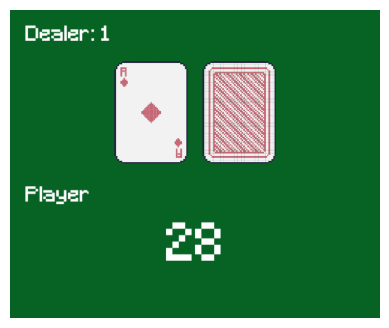

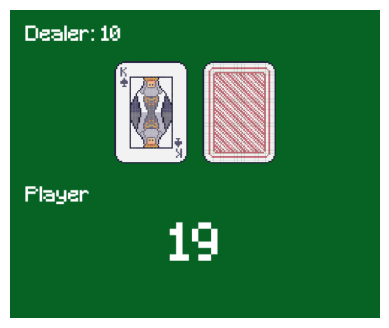

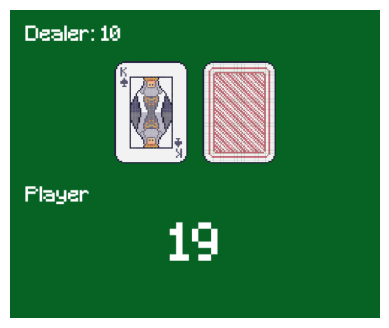

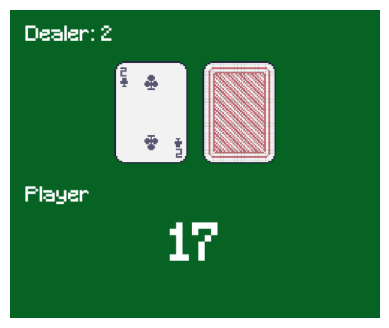

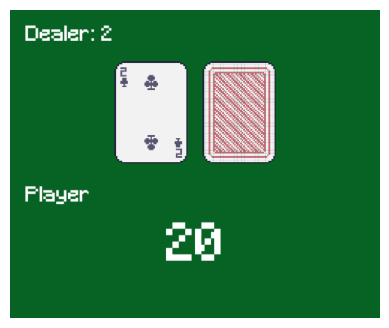

...

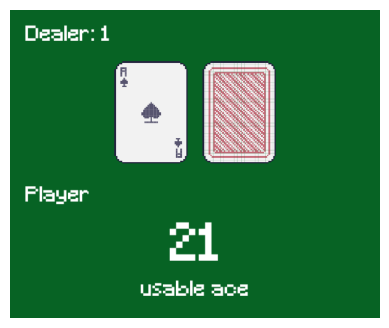

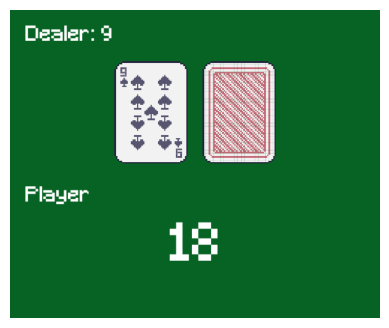

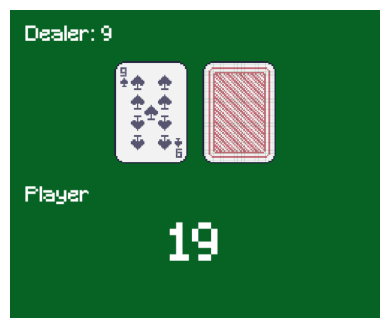

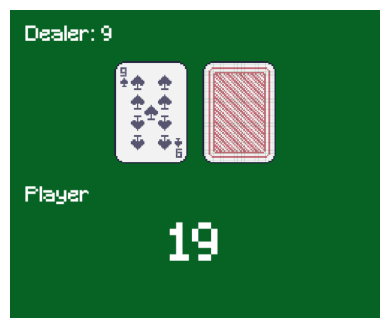

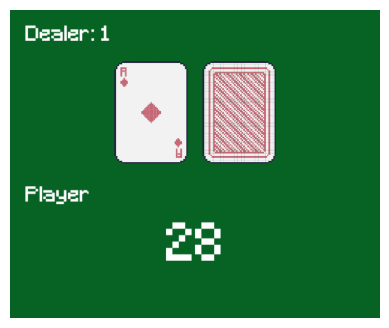

In [6]:
# Watch trained agent
env = gym.make("Blackjack-v1", render_mode='rgb_array')    # Added render mode for compatibility
#env.action_space.seed(42)
rewards = watch_trained_agent(env, qtable, num_rounds=100, epsilon=epsilon, figsize=FIGSIZE)
env.close()

## Create Blackjack Environment and test methods

In [7]:
env = gym.make("Blackjack-v1")
env.observation_space

Tuple(Discrete(32), Discrete(11), Discrete(2))

In [8]:
env.action_space

Discrete(2)

In [9]:
env.reset(seed=SEED)

((10, 10, False), {})

## Q-Learning Functions
* Q-learning functions based on the lookup table approach are available in the `lookup_rl` module

In [10]:
env = gym.make("Blackjack-v1")
env.action_space.seed(SEED)

# get initial state
state = env.reset()

state_size = [x.n for x in env.observation_space]
action_size = env.action_space.n

qtable = np.zeros(state_size + [action_size]) #init with zeros

alpha = 0.3 # learning rate
gamma = 0.1 # discount rate
epsilon = 0.9     # probability that our agent will explore
decay_rate = 0.005

# training variables
num_hands = 500_000

qtable = train_agent(env,
                     qtable,
                     num_hands,
                     alpha,
                     gamma,
                     epsilon,
                     decay_rate)

print(f"Qtable Max: {np.max(qtable)}")
print(f"Qtable Mean: {np.mean(qtable)}")
print(f"Qtable Num Unique Vals: {len(np.unique(qtable))}")


Qtable Max: 1.1111111111109055
Qtable Mean: -0.0972831558600257
Qtable Num Unique Vals: 391


### Observe performance of trained agent in real-time

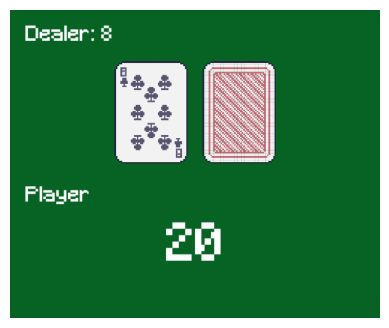

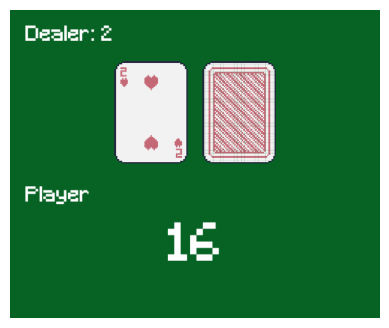

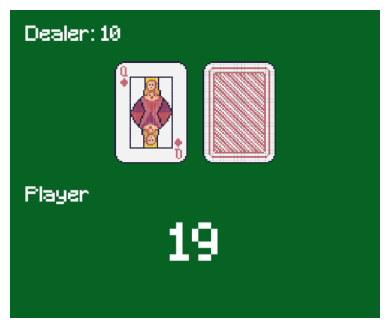

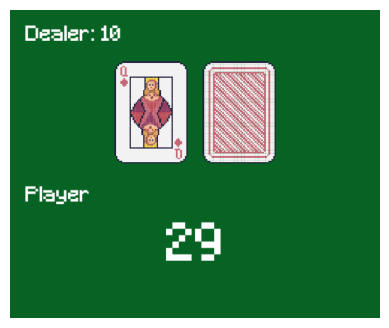

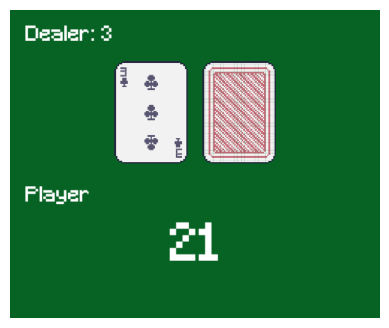

...

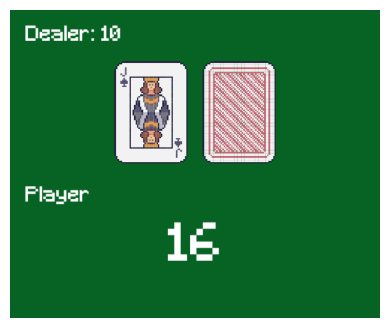

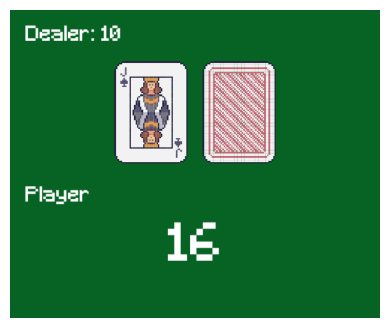

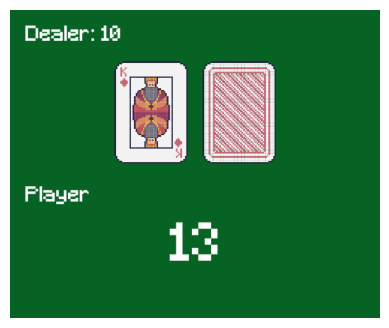

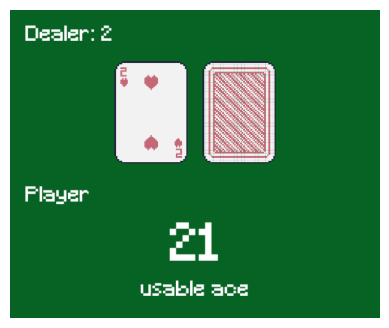

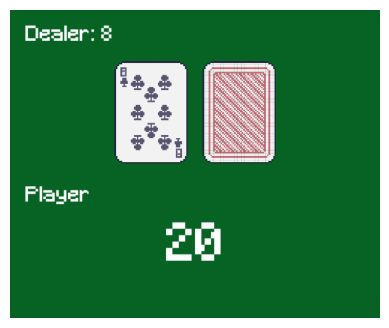

In [11]:
# Watch trained agent
env = gym.make("Blackjack-v1", render_mode='rgb_array')    # Added render mode for compatibility
#env.action_space.seed(42)
rewards = watch_trained_agent(env, qtable, num_rounds=100, epsilon=epsilon, figsize=FIGSIZE)
env.close()

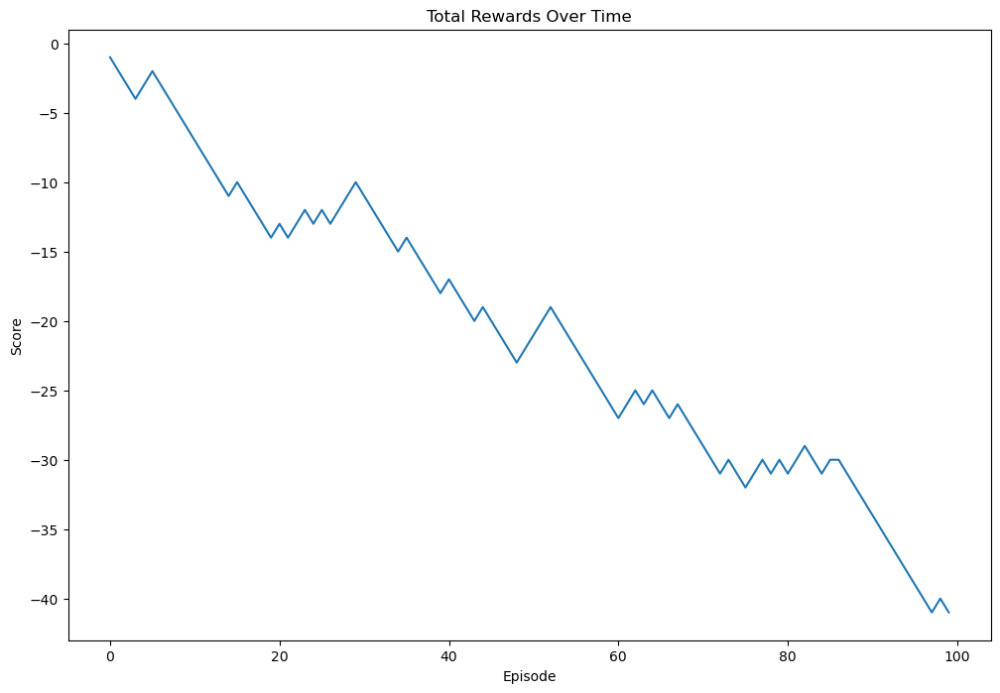

<Figure size 640x480 with 0 Axes>

In [12]:
dst = SM_OUTPUT_DATA_DIR / "local_notebook_lookup_total_rewards_over_time.png"
plt.figure(figsize=(12,8))
plt.plot(np.cumsum(rewards))
plt.ylabel('Score')
plt.xlabel('Episode')
plt.title("Total Rewards Over Time")
plt.show()
plt.savefig(dst)

### Observe performance of trained agent without exploration in real-time

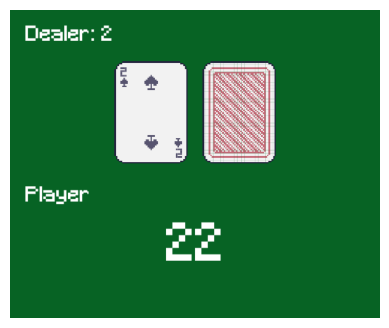

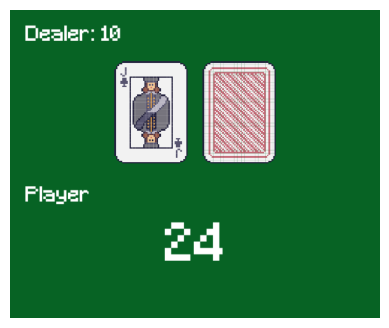

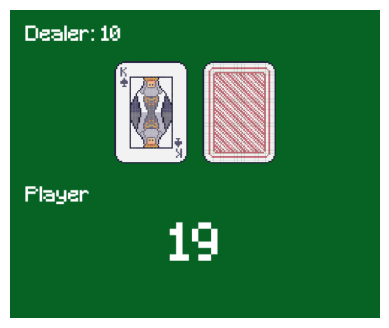

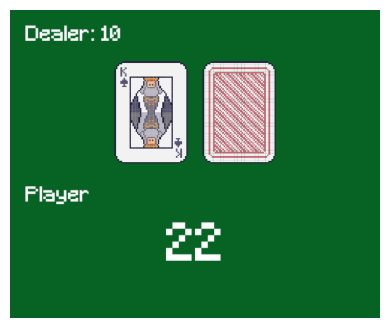

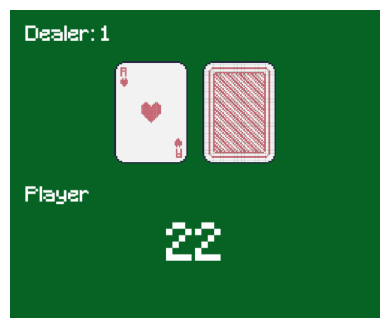

...

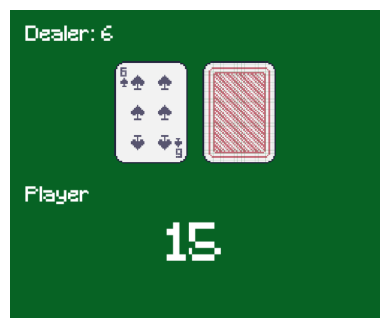

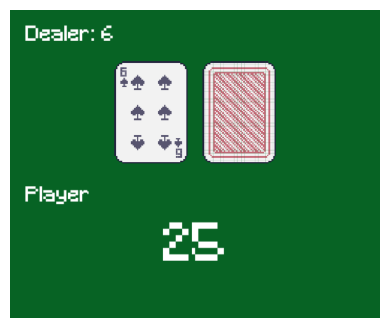

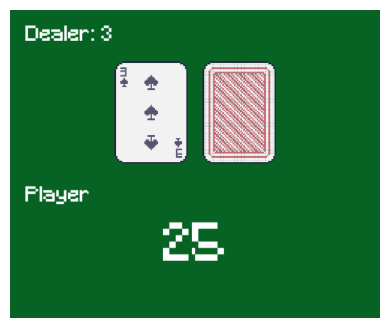

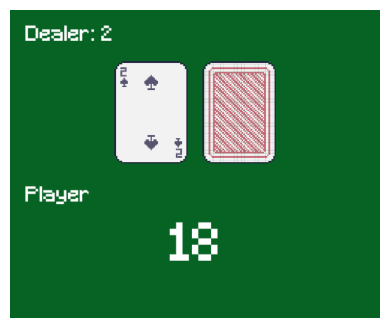

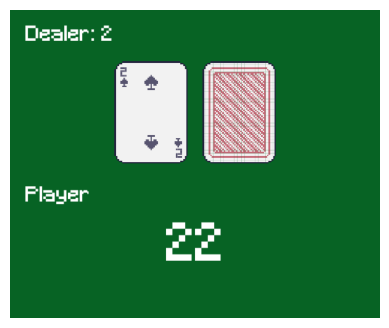

In [13]:
# Watch trained agent
env = gym.make("Blackjack-v1", render_mode='rgb_array')    # Added render mode for compatibility
#env.action_space.seed(42)
rewards = watch_trained_agent_no_exploration(env, qtable, num_rounds=100, epsilon=epsilon, figsize=FIGSIZE)
env.close()

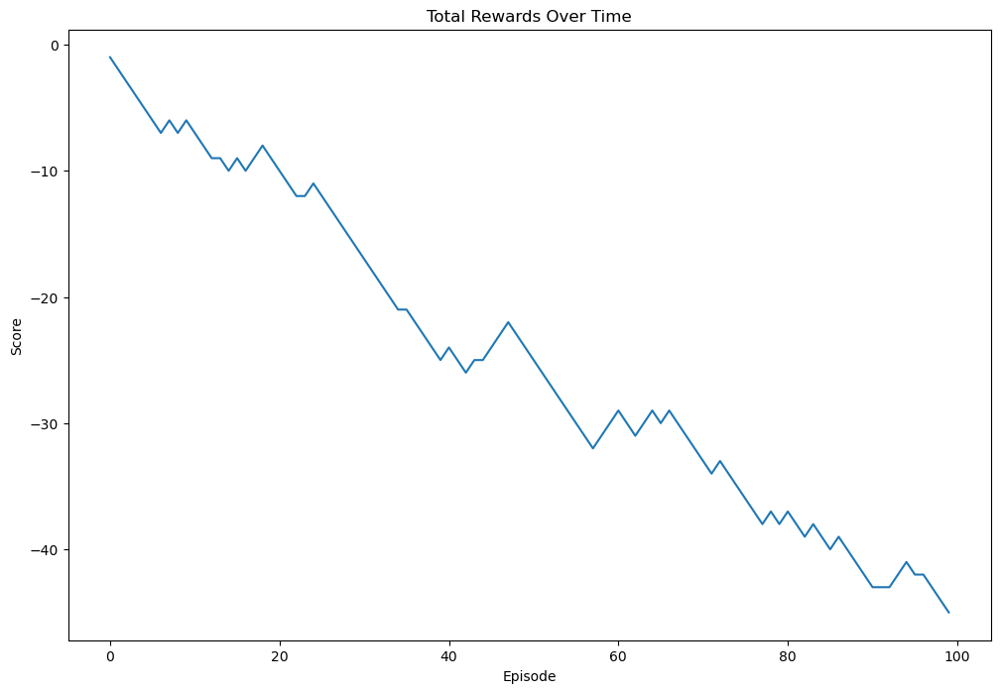

In [14]:
dst = SM_OUTPUT_DATA_DIR / "local_notebook_lookup_total_rewards_over_time_no_exploration.png"
plt.figure(figsize=(12,8))
plt.plot(np.cumsum(rewards))
plt.ylabel('Score')
plt.xlabel('Episode')
plt.title("Total Rewards Over Time")
plt.show()

# Deep RL

## Setup
* Create SageMaker session
* Set bucket and prefix

## Make local directories

In [15]:
for local_dir in [SM_OUTPUT_DATA_DIR, SM_MODEL_DIR, SM_CHANNEL_TRAIN, SM_CHANNEL_TEST]:
    local_dir.mkdir(exist_ok=True, parents=True)

## Train deep RL model and save locally

In [16]:
print("Instantiate env and agent.")
env = gym.make("Blackjack-v1")
env.action_space.seed(SEED)
agent = Agent(
    state_size=3,
    action_size=2,
    lr=LEARNING_RATE,
    gamma=GAMMA,
    tau=TAU,
    buffer_size=BUFFER_SIZE,
    batch_size=BATCH_SIZE,
    update_every=UPDATE_EVERY,
    seed=SEED,
    device=device,
)
print("Train the deep learning reinforcement model.")
scores = dqn(agent, SM_MODEL_PATH, env, n_episodes=N_EPISODES)
env = gym.make("Blackjack-v1", render_mode='rgb_array')  # Added render mode for compatibility

Instantiate env and agent.
Train the deep learning reinforcement model.
Episode 5000	Average Score: 0.001
Episode 10000	Average Score: 0.02
Episode 15000	Average Score: -0.01
Episode 20000	Average Score: 0.010
Episode 25000	Average Score: 0.010
Episode 30000	Average Score: -0.00
Episode 35000	Average Score: -0.01
Episode 40000	Average Score: -0.01
Episode 45000	Average Score: -0.01
Episode 50000	Average Score: 0.010
Episode 55000	Average Score: -0.03
Episode 60000	Average Score: 0.040
Episode 65000	Average Score: 0.020
Episode 70000	Average Score: -0.01


## Upload deep RL model to S3

In [17]:
s3 = boto3.client("s3")
with open(str(SM_MODEL_PATH), "rb") as f:
    s3.upload_fileobj(f, BUCKET, s3_model_path)

In [18]:
from sagemaker.pytorch import PyTorch

## Download deep RL model to local

In [19]:
with open("model.pth", "wb") as f:
    s3.download_fileobj(BUCKET, s3_model_path, f)

## Test deep RL model

Batting Average: 30.00%
Percent Gain: 88.14%


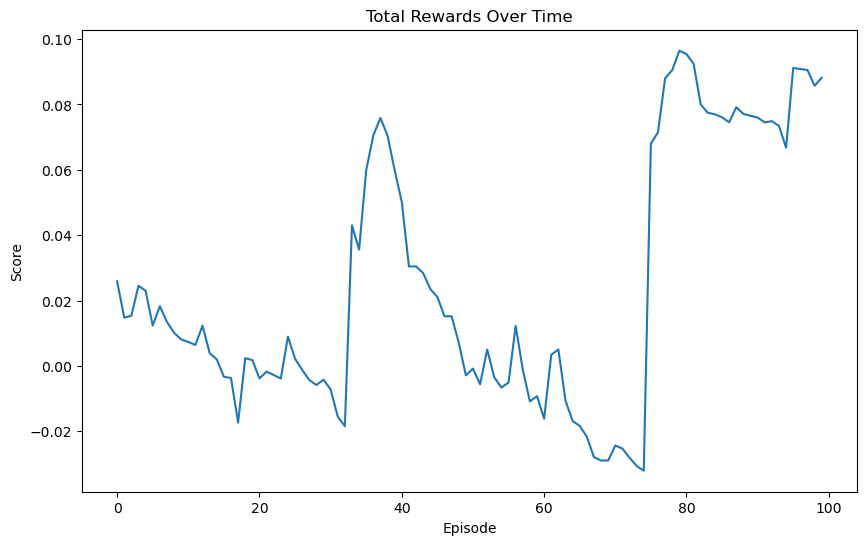

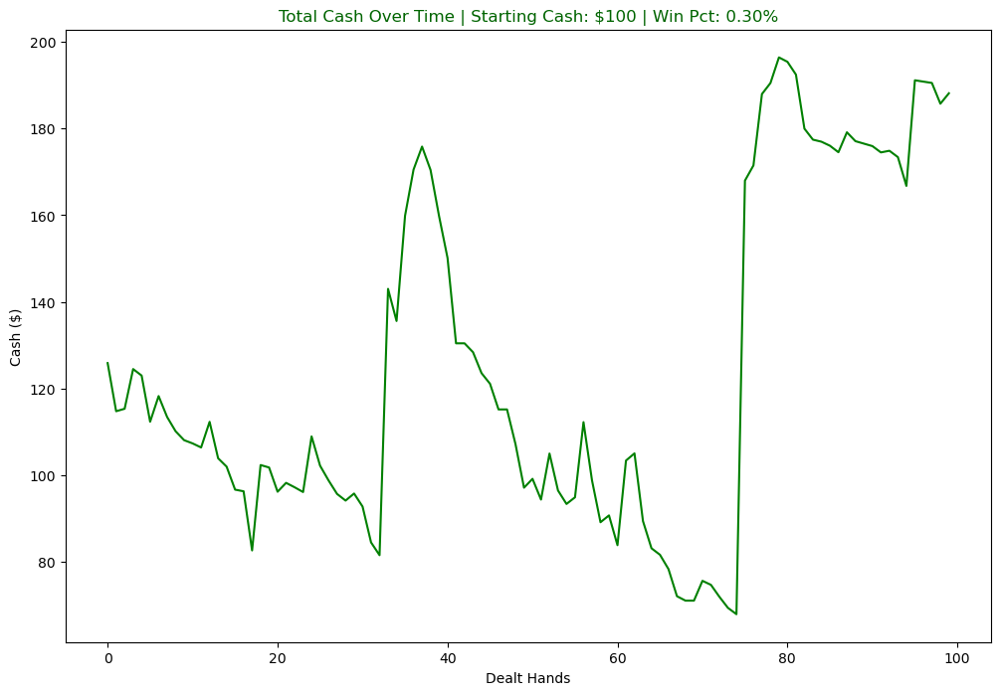

In [20]:
num_hands = 100

agent.qnetwork_local.load_state_dict(torch.load("model.pth"))

results = []
for hand in range(num_hands):
    state, _ = env.reset()                                   # Added _ for new version of gym
    state = np.array(get_state_idxs(state), dtype=float)
    state[0] = state[0]/32
    state[1] = state[1]/10

    done = False
    while not done:
#         frame = env.render()
        action = agent.act(state)
        if isinstance(action, tuple):
            action, value = action
        else:
            value = 1.

        state, reward, done, _, _ = env.step(action)         # Added second _ for new version of gym
        reward *= value
        state = np.array(get_state_idxs(state), dtype=float)
        state[0] = state[0]/32
        state[1] = state[1]/10

    results.append(reward)

env.close()

batting_avg = np.argwhere(np.array(results) > 0).size / len(results)
print(f"Batting Average: {batting_avg*100:.2f}%")

dst = SM_OUTPUT_DATA_DIR / "local_py_dl_rewards_over_time.png"
plt.figure(figsize=(10,6))
plt.plot(np.cumsum(results))
plt.ylabel('Score')
plt.xlabel('Episode')
plt.title("Total Rewards Over Time")
plt.savefig(dst)

dst = SM_OUTPUT_DATA_DIR / "local_py_dl_total_cash_over_time.png"
start_cash = 100.
pct_gain = ((start_cash + np.sum(results)*1000) - 100) / 100
print(f"Percent Gain: {pct_gain*100:.2f}%")
plt.figure(figsize=(12,8))
plt.plot(start_cash + np.cumsum(results)*1000, c="g")
plt.ylabel("Cash ($)")
plt.xlabel("Dealt Hands")
plt.title(f"Total Cash Over Time | Starting Cash: ${int(start_cash)} | Win Pct: {batting_avg:.2f}%", c="darkgreen")
plt.savefig(dst)